## NHL Player Typologies
### GA-SEA-DAT2
##### Project Paper
##### Daniel Johnston 
[Project Repository]('https://github.com/djkjohnston/nhl_project')

When I started considering different topics for my course project, I started with my job. I work at a market research company where we deal with a large amount of survey data. As I explored different possibilities, however, I found that most of the options be both limited in scope and not provide the opprotunity for web based data collection. At the time that I came to this conclusion, I was watching a hockey game; it was serendipitous. I am a big fan of the Boston Bruins; bringing hockey and analytics together was a perfect blend of my interests.

After exploring a few different options for investigation and analysis, I settled on the following questions to drive the project
1. Can players be segmented into typologies base on individual season performance statistics
    * Goals, Blocks, Time on Ice, etc.
2. If a teams mix of player typologies predicts a team's success
    * Success is defined as the Plus/Minus statistic. Plus/Minus is the sum of goals made by a team minus the sum of goals made against a team. A Plus/Minus of 0 means the team makes as many goals as are made against it.

### Data Acquisition

With my questions in mind, I started my search for data to use. It was important to me to gather game level statistics for each player. Game level statistics would give me more flexibility in how I cut or aggregated the data.

After some internet searches, I found a number of different websites:
* [puckalytics.com]('https://puckalytics.com/')
* [www.nicetimeonice.com]('https://www.nicetimeonice.com/')
* [stats.hockeyanalysis.com]('https://stats.hockeyanalysis.com/')
* [www.behindthenet.ca]('https://www.behindthenet.ca/')
* [war-on-ice.com]('https://war-on-ice.com/')
* [nhl.com]('https://nhl.com')

With further searching, I also found out that [nhl.com]('https://nhl.com') also had an API that could be found at [http://statsapi.web.nhl.com/api/v1/game/2015020743/feed/live]('http://statsapi.web.nhl.com/api/v1/game/2015020743/feed/live'). Unfortunately, I was not able to find any documentation for the API, or any mention on [nhl.com]('https://nhl.com') that the API even existed; I found out about it from this [reddit thread]('https://www.reddit.com/r/nhl/comments/2dyj4y/good_sources_of_nhl_stat_feeds_apis_during_the'). 

Despite the lack of documentation, I wanted to attempt to use the NHL API. My reasoning was that data provided directly by the NHL wouldn't require as much validation as data acquired from a third party. After some visual inspection of the API text, along with the URL, I was able to determine that the data was a summary of a specific game. With some experimentation with Postman, I quickly found that the `2025020743` part of the API URL was a unique game ID; in order to collect a season's worth of data, I would need to be have a list of the game IDs in advance.

I considered trying to scrape the IDs from [nhl.com]('https://nhl.com'), but decided to first go through the other websites I found to see if they would have something more turn key. All of the sites looked to be fan supported, so I was hoping that they had already solved the problem I was facing. Luckily, [www.nicetimeonice.com]('https://www.nicetimeonice.com/') maintains a RESTful API that suited my needs perfectly.

##### A quick note on code:
Code examples shown in the remainder of the document are selections from my actual code base. I have worked to ensure that the examples are as complete as necessary. The first comment in each code block will include the name of the file containing the complete code.

In [1]:
#collect_ids.py 
#collecting IDs from nicetimeonice

import requests
import pandas as pd
import json

#start by collecting season IDs
r_seasons = requests.get('http://www.nicetimeonice.com/api/seasons')

#convert r_seasons to data frame for easier manipulation
df_seasons = pd.DataFrame(r_seasons.json(), columns=r_seasons.json()[0].keys())
df_seasons.head() #confirm df built properly



,seasonID
0,20112012
1,20122013
2,20132014
3,20142015
4,20152016


In [2]:
#collect_ids.py
#collect game IDs by season and write to files for later use
for i in df_seasons['seasonID']:
    r_games = requests.get('http://www.nicetimeonice.com/api/seasons/' + i +'/games')
    with open('season' + i + '_games.json', 'w') as f:
        json.dump(r_games.json(), f)

At this point, I decided to limit the scope of my investigation to a single season. Further, I decided to exlcude the post season and players in the goalie position. The structure of the post season was sufficiently different that it struck me as a potential source of uncertainty that was easy to avoid. As for goalies; the nature of the position and the statistics available made me believe that no fruitful conclusions could be found. I arbitrarily decided to use the 2013-2014 season as my universe for the project. The next step was to collect the game level data from the [nhl.com]('https://nhl.com') API.

In [3]:
#collect_game_data.py

import requests
import os
import time

#read in 2013-2014 game IDs previously collected
with open('season20132014_games.json', 'r') as f:
     json_20132014 = json.load(f)

#convert to dataframe
df_20132014 = pd.DataFrame(json_20132014, columns=json_20132014[0].keys())

df_20132014 = df_20132014[(df_20132014['gameType'] == 'Regular')] #subset to regular season games only. Playoffs are excluded

len(df_20132014)

# this code takes ~2 hrs to run
# assume 1 second for API call, + 5 second sleep() = 6 seconds per API call, 1230 calls.
# the code iterates through df_20132014['gameID'], makes a call to the NHL API, then saves the returned data to a json text file.
#for i in df_20132014['gameID']:
#    r_game = requests.get('http://statsapi.web.nhl.com/api/v1/game/' + i + '/feed/live')
#    if r_game.status_code == 200:    
#        with open('game_' + i + '.json', 'w') as f:
#            json.dump(r_game.json(), f)
#        time.sleep(5)

1230

I saved the resulting json data into text files for two reasons.
1. To maintain a record of the raw data
2. I was concerned that I might get my IP blocked from the API if I continued to call it every time I thought of something new to explore. Saving the data locally protected me from that possibility.

The raw text files are ~300 MBs, so I have compressed them to `season20132014_games.7z` which is available in my project repo.


### Data Exploration!
My next step is to figure out the specifics of the data available for each game.

In [4]:
#explore_NHL_game_data.py

#read in game_2013020001.json
with open('game_2013020001.json', 'r') as f:
     game_2013020001 = json.load(f)
        
game_2013020001.keys()

game_2013020001['copyright'] # not helpful
game_2013020001['gameData'] # possibly what i need
game_2013020001['link'] # not helpful
game_2013020001['liveData'] # looks like game summary. Potentially most useful
game_2013020001['gamePk'] # not helpful
game_2013020001['metaData'] #  describes details of the API call

#after some more exploration, the individual player stats were found here
game_2013020001['liveData']['boxscore']['teams']['home']['players']['ID8474189']['stats']['skaterStats']

{u'assists': 1,
 u'blocked': 2,
 u'evenTimeOnIce': u'13:01',
 u'faceOffPct': 50.0,
 u'faceOffWins': 6,
 u'faceoffTaken': 12,
 u'giveaways': 1,
 u'goals': 2,
 u'hits': 2,
 u'penaltyMinutes': 2,
 u'plusMinus': 2,
 u'powerPlayAssists': 0,
 u'powerPlayGoals': 0,
 u'powerPlayTimeOnIce': u'1:29',
 u'shortHandedAssists': 0,
 u'shortHandedGoals': 0,
 u'shortHandedTimeOnIce': u'1:50',
 u'shots': 6,
 u'takeaways': 1,
 u'timeOnIce': u'16:20'}

### Cleaning and Transforming the Data
With an understanding of where the data I wanted lived, I now need to consolidate the data into something usable. 

In [5]:
#collectplayer_data.py
import numpy as np
import pandas.io.json as pij

#create empty team columns to be filled in later
df_20132014['home_roster'] = np.NaN
df_20132014['away_roster'] = np.NaN
#retype to objects
df_20132014['home_roster'].astype('object')
df_20132014['away_roster'].astype('object')

df_20132014.head()

,date,awayTeam,homeTeam,gameID,gameType,home_roster,away_roster
93,"Sat Mar 29, 2014",Montreal Canadiens,Florida Panthers,2013021112,Regular,NaN,NaN
94,"Fri Feb 07, 2014",Columbus Blue Jackets,San Jose Sharks,2013020871,Regular,NaN,NaN
95,"Sun Apr 13, 2014",Dallas Stars,Arizona Coyotes,2013021230,Regular,NaN,NaN
96,"Sun Apr 13, 2014",Calgary Flames,Vancouver Canucks,2013021228,Regular,NaN,NaN
97,"Sun Apr 13, 2014",Colorado Avalanche,Anaheim Ducks,2013021229,Regular,NaN,NaN


In [6]:
#collectplayer_data.py

#this code can take 5~10 minutes to run. 
#If you want to run it, extract 'season20132014_games.7z' to '\season20132014_games' in your working directory
#create a df that contains player data for each game

#make an empty df to populate
game_rosters = pd.DataFrame(columns=['gameID','team_name','team_ice','player', 'position', 'stats'])

for i in df_20132014.gameID:
    #read in game data
    with open('season20132014_games\game_' + i + '.json', 'r') as f:
         game = json.load(f)
    
    for j in game['liveData']['boxscore']['teams'].keys(): #for each game, teams are assigned home and away
        for k in game['liveData']['boxscore']['teams'][j]['skaters']: #loop through each player
            try:    
                temp_stats = game['liveData']['boxscore']['teams'][j]['players']['ID' + str(k)]['stats']['skaterStats']
            except KeyError: #not all players have stats, so an exception is needed
                temp_stats = np.NaN            
            
            #add the player/game stat to game_roster
            game_rosters = game_rosters.append({'gameID':i, 
                                 'team_name': game['liveData']['boxscore']['teams'][j]['team']['name'], 
                                 'team_ice': j, 
                                 'player': str(k), 
                                 'position': game['liveData']['boxscore']['teams'][j]['players']['ID' + str(k)]['position']['name'],
                                 'stats': temp_stats}, ignore_index=True)

            

game_rosters.dropna(inplace=True) #drop rows created by the KeyError exception 
game_rosters.reset_index(inplace=True) #reset index for concatting later
game_rosters.head()

,index,gameID,team_name,team_ice,player,position,stats
0,0,2013021112,Florida Panthers,home,8475153,Defenseman,"{u'timeOnIce': u'14:22', u'plusMinus': -1, u'h..."
1,1,2013021112,Florida Panthers,home,8475179,Defenseman,"{u'timeOnIce': u'27:28', u'plusMinus': -1, u'h..."
2,2,2013021112,Florida Panthers,home,8474625,Right Wing,"{u'timeOnIce': u'13:07', u'plusMinus': 0, u'hi..."
3,3,2013021112,Florida Panthers,home,8470039,Left Wing,"{u'timeOnIce': u'15:21', u'plusMinus': -1, u'h..."
4,4,2013021112,Florida Panthers,home,8474498,Center,"{u'timeOnIce': u'11:41', u'plusMinus': -1, u'h..."


In [7]:
#collectplayer_data.py

#parse stats column into seperate columns
stats_json = game_rosters.stats.to_json(orient = 'records') #seperate stats into json object
stats_df = pd.read_json(stats_json) #use read_json to create seperate columns from json dict

game_rosters = pd.concat([game_rosters, stats_df], axis=1) #concatonate the two dataframes
player_game_stats = game_rosters #create player_game_stats, which is a more appropriately named df

After some exploration, I notice that most time columns are strings with mm:ss format. I decide to create integer features representing the number of seconds for each time based feature. The times are all bound to a single game; a heavy work load for a player is 30 or more minutes of time on ice per game. With this in mind, seconds is a perfectly managable scale.

In [8]:
#collectplayer_data.py

#function to convert mm:ss unicode object to int variables containing the total seconds
def get_sec(s):
    l = s.split(':')
    return int(l[0]) * 60 + int(l[1])

seconder = lambda x: get_sec(x)

player_game_stats['evenTimeOnIce_s'] = player_game_stats['evenTimeOnIce'].map(seconder)
player_game_stats['powerPlayTimeOnIce_s'] = player_game_stats['powerPlayTimeOnIce'].map(seconder)
player_game_stats['shortHandedTimeOnIce_s'] = player_game_stats['shortHandedTimeOnIce'].map(seconder)
player_game_stats['timeOnIce_s'] = player_game_stats['timeOnIce'].map(seconder)

#penatlyMinutes is the exception to the time format.
player_game_stats['penaltyMinutes_s'] = player_game_stats['penaltyMinutes']*60

Now, I need to create season summary data for each player. I decide to use means as a summary. I know I want to use a statistic to describe central tendancies to make the approach equally applicable to every player regardless of the number of games played. The use of mean may be re-evaluated in the future for another descriptive statistic (median?)

In [9]:
#collectplayer_data.py

#create empty df with player id as index, stats variables as columns. 
#to be used to show season cumulative sums

player_season_mean_stats = pd.DataFrame(index=player_game_stats.player.unique(), 
                                   columns = ['assists','blocked','evenTimeOnIce_s',
                                   'faceOffWins','faceoffTaken',
                                   'giveaways','goals','hits','penaltyMinutes_s',
                                   'plusMinus','powerPlayAssists','powerPlayGoals',
                                   'powerPlayTimeOnIce_s','shortHandedAssists',
                                   'shortHandedGoals','shortHandedTimeOnIce_s',
                                   'shots','takeaways','timeOnIce_s'])

#loop through rows and columns and take mean from 'player_game_stats'
for i in list(player_season_mean_stats.index):
    for j in player_season_mean_stats.columns.values:
        player_season_mean_stats[j][i] = player_game_stats[player_game_stats.player == i][j].mean()
        
player_season_mean_stats.head()

,assists,blocked,evenTimeOnIce_s,faceOffWins,faceoffTaken,giveaways,goals,hits,penaltyMinutes_s,plusMinus,powerPlayAssists,powerPlayGoals,powerPlayTimeOnIce_s,shortHandedAssists,shortHandedGoals,shortHandedTimeOnIce_s,shots,takeaways,timeOnIce_s
8475153,0.204545,1.25,827.955,0,0,0.340909,0.0681818,2.63636,10.9091,-0.0681818,0.0227273,0,11.1591,0,0,87.0909,1.36364,0.409091,926.205
8475179,0.135802,1.1358,1049.68,0,0,0.580247,0.0987654,1.54321,48.8889,-0.320988,0.037037,0.0246914,143.444,0,0.0123457,108.469,1.5679,0.358025,1301.59
8474625,0.127273,0.345455,583.709,0.2,0.545455,0.0909091,0.2,2.09091,19.6364,-0.0909091,0.0181818,0.0545455,74.0727,0,0,0.254545,1.30909,0.254545,658.036
8470039,0.25,0.1375,808.087,0.0625,0.225,0.325,0.1,0.7375,16.5,-0.225,0.0625,0.025,155.463,0.0125,0,63.6875,2.35,0.375,1027.24
8474498,0.173077,0.403846,628.635,1.21154,2.5,0.173077,0.173077,1.25,43.8462,-0.0384615,0,0.0192308,20.9038,0,0,114.692,1.92308,0.173077,764.231


I also add in the number of games played, as well as player position to the `player_season_mean_stats` dataframe. The final dataframe is then saved out to `player_season_mean_stats.csv` 

### Exploratory Analysis

At this point, I am comfortable with the dataset that I have defined. What I am less certain of, however, is the predictive power of the data that I have in hand. I decide to test this by exploring the predictive quality of the statistics on a known feature, specifically Player Position. My working theory is that if the statistics can't be used to predict position, they may not be able to identify an unidentified categorization for clustering.

I proceed with using KNN because it is relatively simple, and my dataset is relatively small. Random States are set to 1 where applicable for reproducability. The data is also standardized; the time columns in particular would have dominated the KNN without scaling.

In [10]:
#KNN_player_position.py

#started with previously saved data
player_season_mean_stats = pd.read_csv('player_season_mean_stats.csv', index_col = 0)

#import KNN and evaluation tools
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.cross_validation import train_test_split
from sklearn import metrics

#map position to numbers
player_season_mean_stats['pos_num'] = player_season_mean_stats.position.map({'Defenseman':0, 'Center':1, 'Right Wing':2, 'Left Wing':3})

#concered that L/R wing will look similar, so grouping here
player_season_mean_stats['pos_num_simplified'] = player_season_mean_stats.position.map({'Defenseman':0, 'Center':1, 'Right Wing':2, 'Left Wing':2})

#and mapping to defense vs forward
player_season_mean_stats['pos_num_forward'] = player_season_mean_stats.position.map({'Defenseman':0, 'Center':1, 'Right Wing':1, 'Left Wing':1})


#excluding Faceoffs because they are exclusively taken by centers.
#i want to see if the KNN can work with common stats
#also removing games played b/c that may be influence by external factors
#removing timeOnIce_s as it is a sum of other features
feature_cols = ['assists', 'blocked', 'evenTimeOnIce_s', 'giveaways', 
                'goals', 'hits', 'penaltyMinutes_s', 'plusMinus', 'powerPlayAssists', 
                'powerPlayGoals', 'powerPlayTimeOnIce_s', 'shortHandedAssists', 'shortHandedGoals',
                'shortHandedTimeOnIce_s', 'shots', 'takeaways']

X = player_season_mean_stats[feature_cols]
y = player_season_mean_stats['pos_num']


#time variables are on a much larger scale than other stats. 
#Need to scalerize potential features
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)

#test train split. Scale before splitting so scaling factors are identical
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, random_state=1)

knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train, y_train)
y_pred_class = knn.predict(X_test)

print 'pos_num: %f' % metrics.accuracy_score(y_test, y_pred_class) #pretty terrible.

#trying with pos_num_forward
y = player_season_mean_stats['pos_num_forward']

#test train split. Scale before splitting so scaling factors are identical
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, random_state=1)

knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train, y_train)
y_pred_class = knn.predict(X_test)

print 'pos_num_forward: %f' % metrics.accuracy_score(y_test, y_pred_class) #massive jump to 96%

#trying with pos_num_simplified
y = player_season_mean_stats['pos_num_simplified']

#test train split. Scale before splitting so scaling factors are identical
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, random_state=1)

knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train, y_train)
y_pred_class = knn.predict(X_test)

print 'pos_num_simplified: %f' % metrics.accuracy_score(y_test, y_pred_class) #~10% increase over pos_num. Still not great. much worse than pos_num_forward

pos_num: 0.567568
pos_num_forward: 0.959459
pos_num_simplified: 0.653153


As we can see, the best predictive power is to be had when we group all forward positions together. However, this feels overly simplified to me, so I decide to see if I can optimize the KNN for pos_num_simplified (groups Wing positions together, but keeps Center separate.)

To do this, I set up a large nested for loop that iterates through feature combinations and number of neighbors. The code can be found in `KNN_player_position.py`. The best estimator found had the following parameters:
* Features: ['assists', 'blocked', 'evenTimeOnIce_s', 'giveaways', 'goals', 'penaltyMinutes_s','plusMinus', 'powerPlayAssists', 'shortHandedTimeOnIce_s', 'shots', 'takeaways']
* Neighbors: 9 
* Cross Validation Accuracy Mean: 0.741054510623

The refined results show marked improvement over the blind KNN testing above, but still leaves room for improvement. 

I also tried testing the effectiveness of the KNN (using parameters above) but limiting the player universe to players with a minimum number of games. The code is also available in `KNN_player_position.py` but I found that increasing the minimum number of games leads to marginal increase in accuracy. The above accuracy of ~74% is based on players who played in at least one game. Limiting the dataset to players with a minimum of  50 games results in an accuracy of ~77%. I would rather have a deeper dataset with a slightly decreased accuracy, so I will move forward without limiting the player list based on the number of games played.

### Preliminary Clustering

At this point, I am comfortable enough with the data and the predictive power of the features to start some clustering. To start, I want to visually inspect the features to identify any opprotunities for feature reduction. I use a scatter matrix.

I also exclude some features such as position and Plus/Minus. My goal is to identify new typologies based on play style, not so much current position. Face Off features are also excluded because they are specific to Centers

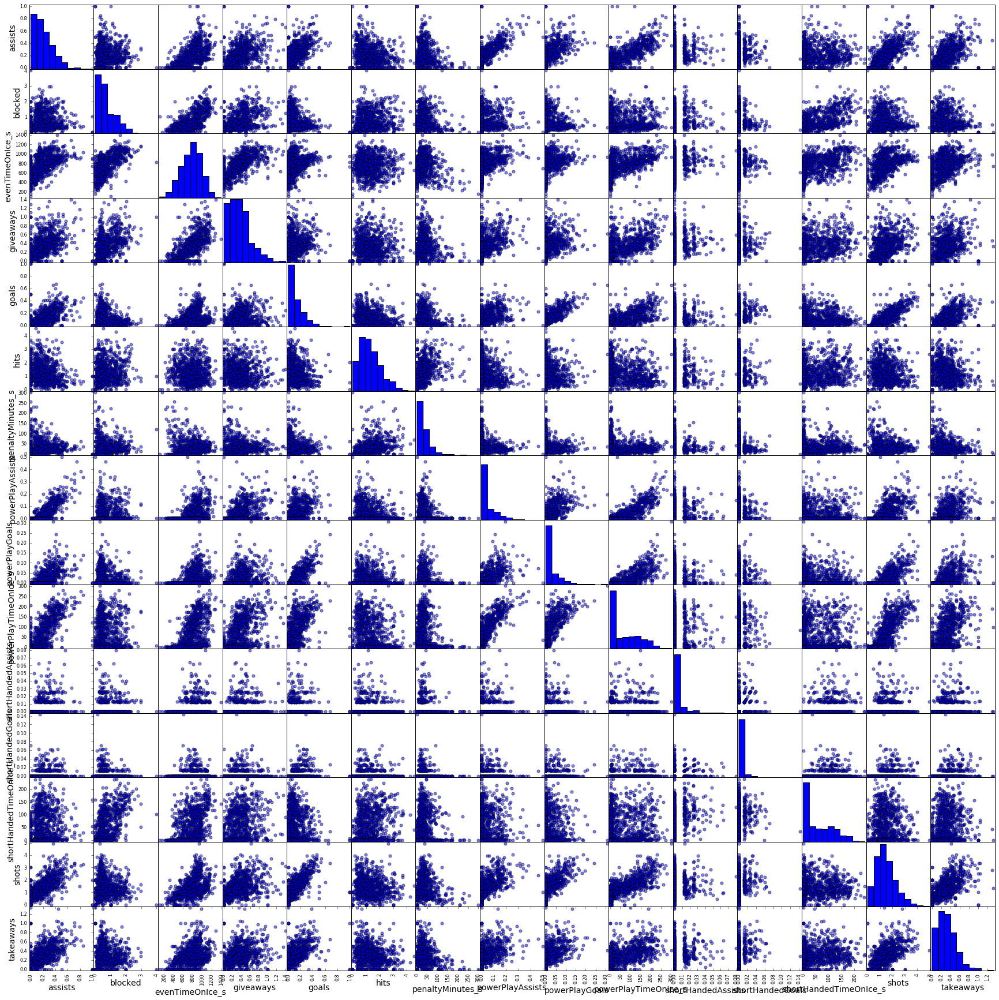

In [11]:
#prelim_cluster_test.py

#re-read in data because I do not want anything added from KNN tests
player_season_mean_stats = pd.read_csv('player_season_mean_stats.csv', index_col = 0)

X = player_season_mean_stats.drop(['games_played', 'position', 'plusMinus', 'timeOnIce_s', 'faceoffTaken', 'faceOffWins'], axis=1)
X_scaled = scaler.fit_transform(X)

#make an ugly scatter plot to get a sense of potential feature reduction
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams['font.size'] = 14

scatter = pd.scatter_matrix(X, figsize=(30,30), s=100) #feeding scatter matrix into a variable suppresses some text output.

A quick observation: powerplay stats seem to be moderately coorelated with overall stats. Consider removing powerplay stats except for time on ice. For now, I want to leave all current features in for cluster testing.

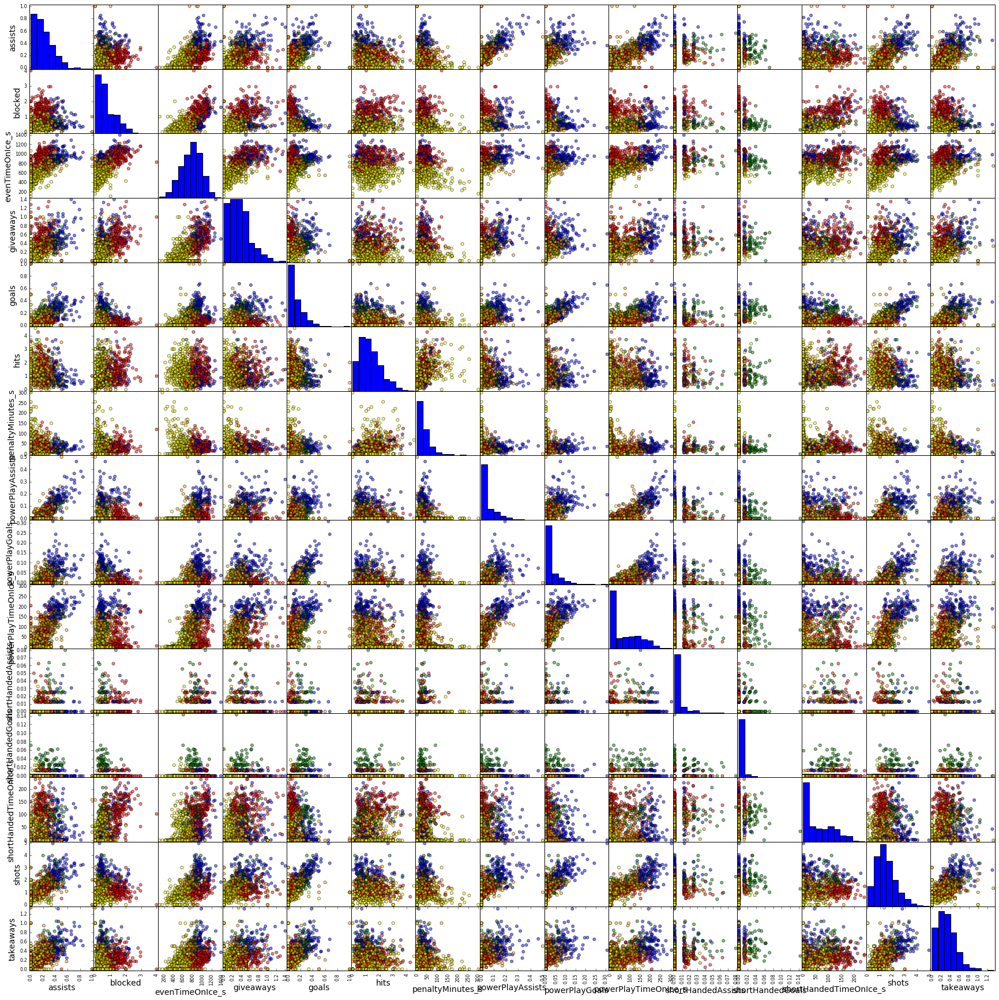

In [12]:
#prelim_cluster_test.py

#run some clusters without any further feature reduction
from sklearn.cluster import KMeans
km = KMeans(n_clusters=5, random_state=1)
km.fit(X_scaled)

player_season_mean_stats['cluster'] = km.labels_

import numpy as np
colors = np.array(['red', 'green', 'blue', 'yellow', 'orange'])

scatter = pd.scatter_matrix(X, c=colors[player_season_mean_stats.cluster], figsize=(30,30), s=100)

Powerplay and Short Handed statistics correlate very strongly with their overall counterparts, so I try removing those features.

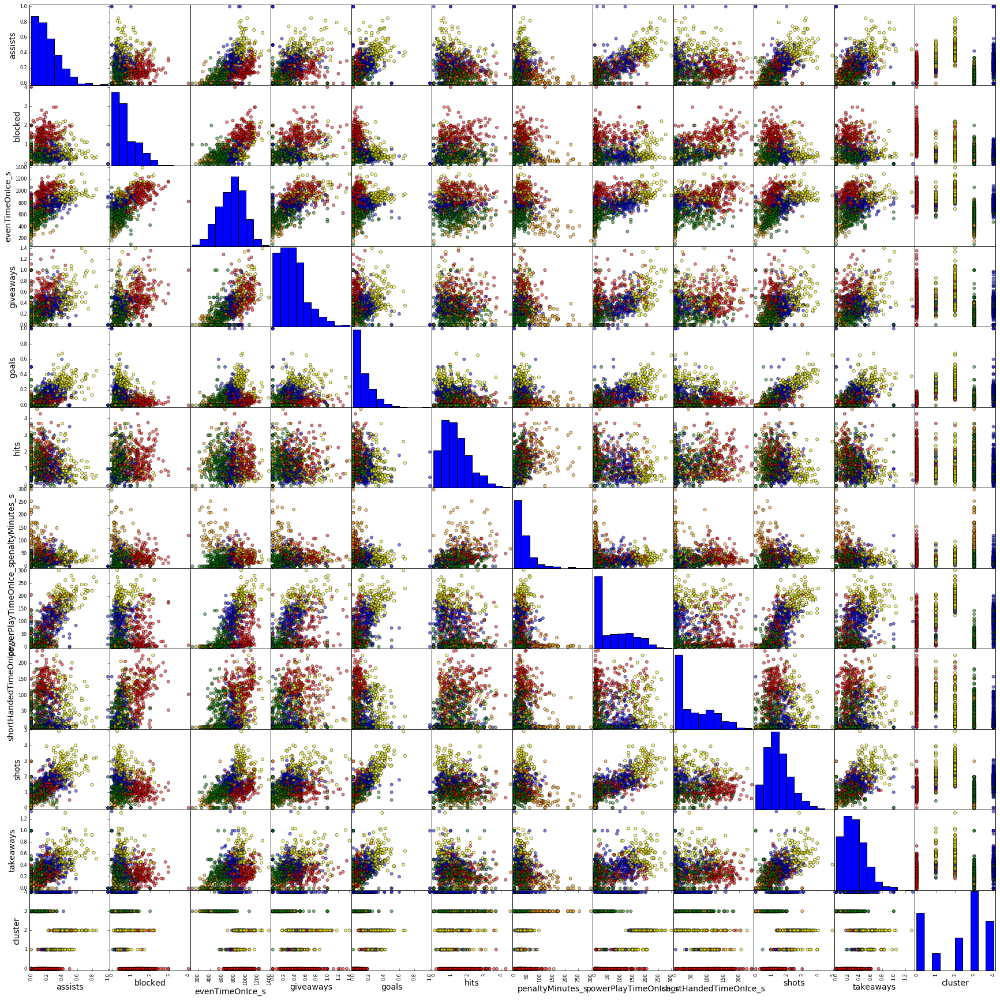

In [13]:
#prelim_cluster_test.py

#removing some features
scaler = StandardScaler()
X = player_season_mean_stats.drop(['games_played', 'position', 'plusMinus', 'timeOnIce_s', 'faceoffTaken', 'faceOffWins', 'powerPlayAssists', 'powerPlayGoals', 'shortHandedAssists', 'shortHandedGoals'], axis=1)
X_scaled = scaler.fit_transform(X)

km = KMeans(n_clusters=5, random_state=1)
km.fit(X_scaled)

player_season_mean_stats['cluster'] = km.labels_

scatter = pd.scatter_matrix(X, c=colors[player_season_mean_stats.cluster], figsize=(30,30), s=100)

I see relatively little differentiation in hits, so I want to try to rerun without it.

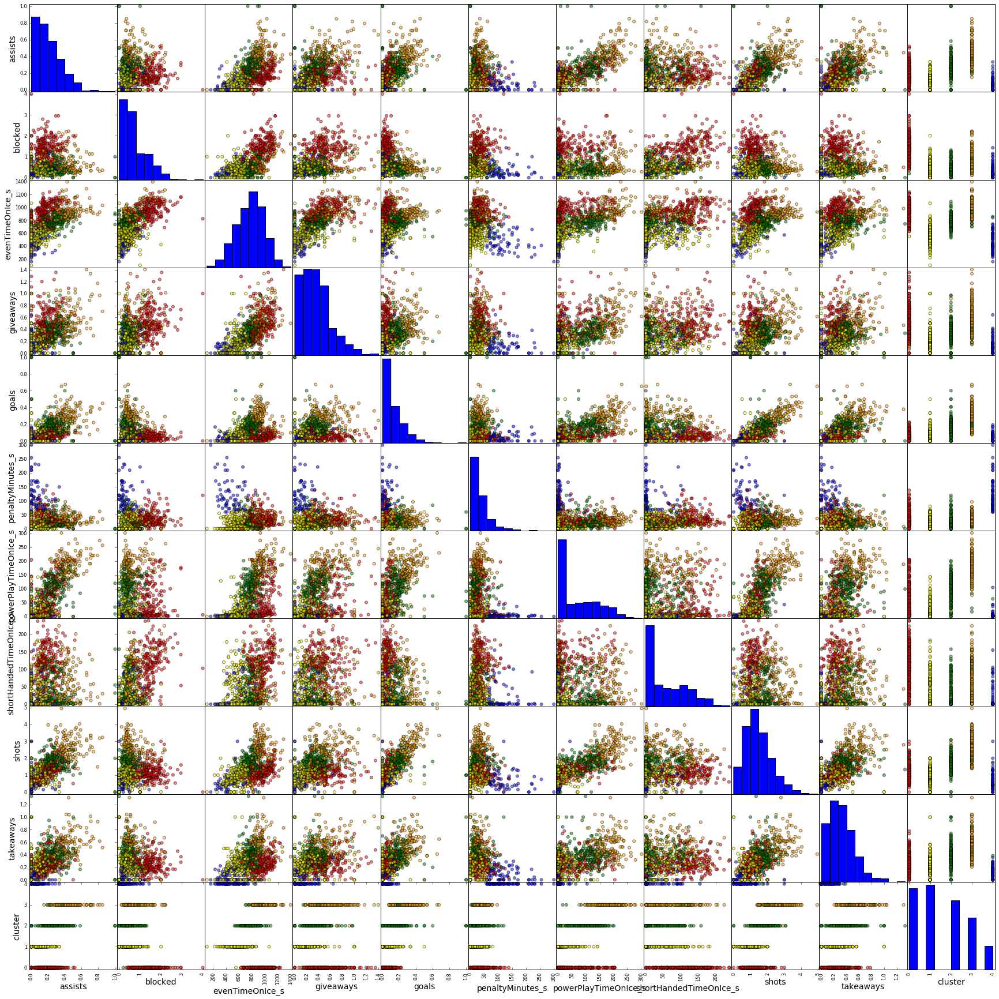

In [14]:
#prelim_cluster_test.py
#removing hits
scaler = StandardScaler()
X = player_season_mean_stats.drop(['games_played', 'position', 'plusMinus', 'timeOnIce_s', 'faceoffTaken', 'faceOffWins', 'powerPlayAssists', 'powerPlayGoals', 'shortHandedAssists', 'shortHandedGoals', 'hits'], axis=1)
X_scaled = scaler.fit_transform(X)

km = KMeans(n_clusters=5, random_state=1)
km.fit(X_scaled)

player_season_mean_stats['cluster'] = km.labels_

scatter = pd.scatter_matrix(X, c=colors[player_season_mean_stats.cluster], figsize=(30,30), s=100)

I am relatively happy with these clusters. Each feature seems to be reasonably well differentiated. That being said, I think I need to take a step back to take two steps forward (see below.)

### Transforming Data
After initial clustering tests, I have decided to create new features and reevaluate the clustering. At a classmate's suggestion, I watched a [presentation by Tyler Oberly]('https://www.youtube.com/watch?v=J2NZ9WvvIxA') on NFL Elitics and sports analysis. While not completely applicable, the concept of player efficiency struck me as a great evolution to my analysis. Because I am using K-Means for clustering, two players with 20 goals will be treated the same (in that dimension) even if player 1 took 50 shots and player 2 took 200 shots. In addition to rates of success, I want to look at stats per unit time on ice such as blocks per minute or penalty minutes per ice minute. 

In [16]:
#player_efficiency.py
#create empty df to hold efficiency stats
player_eff = pd.DataFrame(index = player_season_mean_stats.index)

#overall stats
player_eff['timeOnIce_s'] = player_season_mean_stats['timeOnIce_s']
player_eff['shots_per_min'] = player_season_mean_stats.shots / (player_season_mean_stats.timeOnIce_s / 60)
player_eff['goals_per_min'] = player_season_mean_stats.goals / (player_season_mean_stats.timeOnIce_s / 60)
player_eff['goals_per_shot'] = player_season_mean_stats.goals / player_season_mean_stats.shots
player_eff['assists_per_min'] = player_season_mean_stats.assists / (player_season_mean_stats.timeOnIce_s / 60)
player_eff['blocks_per_min'] = player_season_mean_stats.blocked / (player_season_mean_stats.timeOnIce_s / 60)
player_eff['giveaways_per_min'] = player_season_mean_stats.giveaways / (player_season_mean_stats.timeOnIce_s / 60)
player_eff['hits_per_min'] = player_season_mean_stats.hits / (player_season_mean_stats.timeOnIce_s / 60)
player_eff['penaltyMinutes_per_min'] = (player_season_mean_stats.penaltyMinutes_s / 60) / (player_season_mean_stats.timeOnIce_s / 60)
player_eff['takeaways_per_min'] = player_season_mean_stats.takeaways / (player_season_mean_stats.timeOnIce_s / 60)
player_eff['faceOff_wins_per_attempt'] = player_season_mean_stats.faceOffWins / player_season_mean_stats.faceoffTaken
#power play stats
player_eff['pp_goals_per_min'] = player_season_mean_stats.powerPlayGoals / (player_season_mean_stats.powerPlayTimeOnIce_s / 60)
player_eff['pp_assists_per_min'] = player_season_mean_stats.powerPlayAssists / (player_season_mean_stats.powerPlayTimeOnIce_s / 60)
player_eff['pp_share_of_time'] = player_season_mean_stats.powerPlayTimeOnIce_s / (player_season_mean_stats.timeOnIce_s)
#short handed stats
player_eff['sh_goals_per_min'] = player_season_mean_stats.shortHandedGoals / (player_season_mean_stats.shortHandedTimeOnIce_s / 60)
player_eff['sh_assists_per_min'] = player_season_mean_stats.shortHandedAssists / (player_season_mean_stats.shortHandedTimeOnIce_s / 60)
player_eff['sh_share_of_time'] = player_season_mean_stats.shortHandedTimeOnIce_s / (player_season_mean_stats.timeOnIce_s)

#recode NaN to 0
player_eff.fillna(0, inplace=True)

Testing some clustering see how the results change

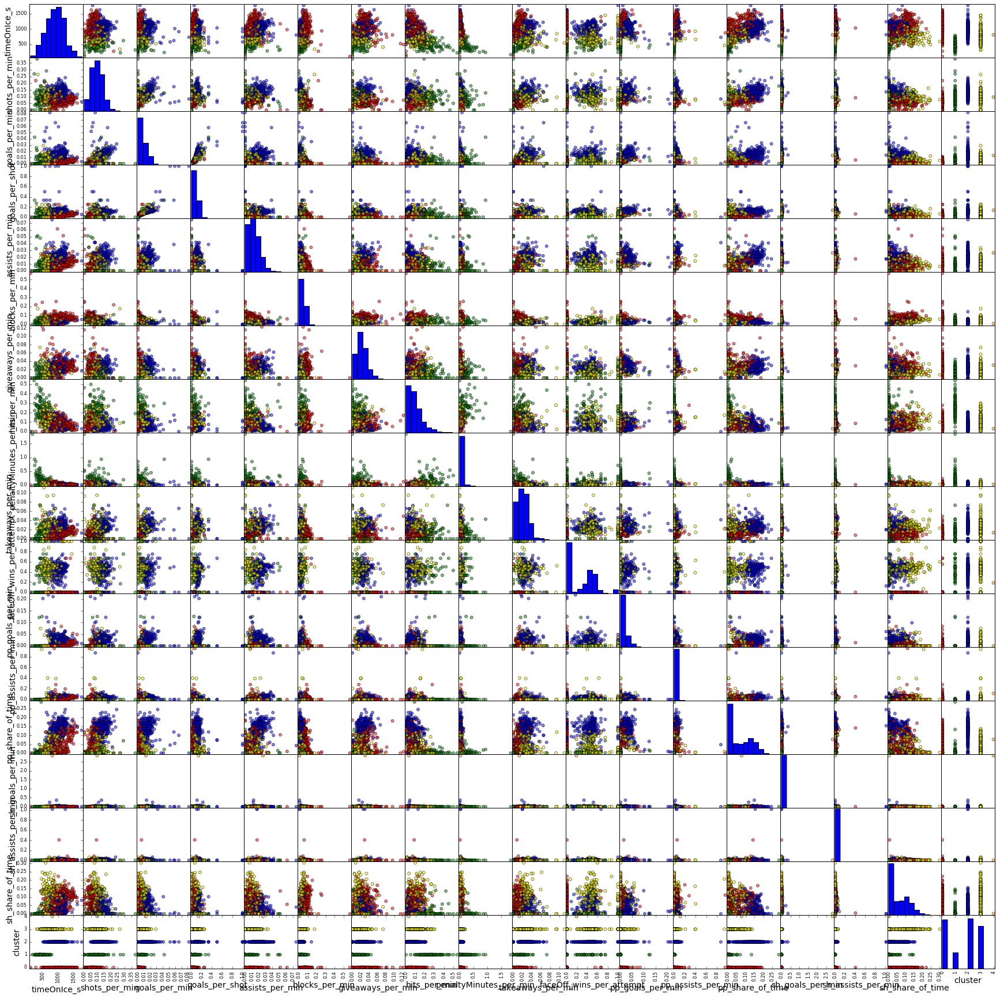

In [17]:
scaler = StandardScaler()
X  = player_eff
X_scaled = scaler.fit_transform(X)

km = KMeans(n_clusters=5, random_state=1)
km.fit(X_scaled)
    
player_eff['cluster'] = km.labels_
scatter = pd.scatter_matrix(X, c=colors[player_eff.cluster], figsize=(30,30), s=100)

After testing a number of different clustering models, I noticed that any model with more than 3 clusters resulted with at least one cluster with very small base sizes. Further investication found that small clusters were mostly driven by players with very few (<5) games.

In [18]:
#player_efficiency.py
player_season_mean_stats_trimmed = player_season_mean_stats[player_season_mean_stats.games_played >= 5]

#create empty df to hold efficiency stats
player_eff_trimmed = pd.DataFrame(index = player_season_mean_stats_trimmed.index)

#overall stats
player_eff_trimmed['timeOnIce_s'] = player_season_mean_stats_trimmed['timeOnIce_s']
player_eff_trimmed['shots_per_min'] = player_season_mean_stats_trimmed.shots / (player_season_mean_stats_trimmed.timeOnIce_s / 60)
player_eff_trimmed['goals_per_min'] = player_season_mean_stats_trimmed.goals / (player_season_mean_stats_trimmed.timeOnIce_s / 60)
player_eff_trimmed['goals_per_shot'] = player_season_mean_stats_trimmed.goals / player_season_mean_stats_trimmed.shots
player_eff_trimmed['assists_per_min'] = player_season_mean_stats_trimmed.assists / (player_season_mean_stats_trimmed.timeOnIce_s / 60)
player_eff_trimmed['blocks_per_min'] = player_season_mean_stats_trimmed.blocked / (player_season_mean_stats_trimmed.timeOnIce_s / 60)
player_eff_trimmed['giveaways_per_min'] = player_season_mean_stats_trimmed.giveaways / (player_season_mean_stats_trimmed.timeOnIce_s / 60)
player_eff_trimmed['hits_per_min'] = player_season_mean_stats_trimmed.hits / (player_season_mean_stats_trimmed.timeOnIce_s / 60)
player_eff_trimmed['penaltyMinutes_per_min'] = (player_season_mean_stats_trimmed.penaltyMinutes_s / 60) / (player_season_mean_stats_trimmed.timeOnIce_s / 60)
player_eff_trimmed['takeaways_per_min'] = player_season_mean_stats_trimmed.takeaways / (player_season_mean_stats_trimmed.timeOnIce_s / 60)
player_eff_trimmed['faceOff_wins_per_attempt'] = player_season_mean_stats_trimmed.faceOffWins / player_season_mean_stats_trimmed.faceoffTaken
#power play stats
player_eff_trimmed['pp_goals_per_min'] = player_season_mean_stats_trimmed.powerPlayGoals / (player_season_mean_stats_trimmed.powerPlayTimeOnIce_s / 60)
player_eff_trimmed['pp_assists_per_min'] = player_season_mean_stats_trimmed.powerPlayAssists / (player_season_mean_stats_trimmed.powerPlayTimeOnIce_s / 60)
player_eff_trimmed['pp_share_of_time'] = player_season_mean_stats_trimmed.powerPlayTimeOnIce_s / (player_season_mean_stats_trimmed.timeOnIce_s)
#short handed stats
player_eff_trimmed['sh_goals_per_min'] = player_season_mean_stats_trimmed.shortHandedGoals / (player_season_mean_stats_trimmed.shortHandedTimeOnIce_s / 60)
player_eff_trimmed['sh_assists_per_min'] = player_season_mean_stats_trimmed.shortHandedAssists / (player_season_mean_stats_trimmed.shortHandedTimeOnIce_s / 60)
player_eff_trimmed['sh_share_of_time'] = player_season_mean_stats_trimmed.shortHandedTimeOnIce_s / (player_season_mean_stats_trimmed.timeOnIce_s)

player_eff_trimmed.fillna(0, inplace=True)

Now that I am more comfortable with the features and the players to be used, I want to test a wide array of different clusters and feature combinations.

In [20]:
#player_efficiency.py
features = ['timeOnIce_s', 'shots_per_min', 'goals_per_shot', 'assists_per_min', 
            'blocks_per_min', 'giveaways_per_min', 'hits_per_min', 
            'penaltyMinutes_per_min', 'takeaways_per_min', 'faceOff_wins_per_attempt',  
            'pp_share_of_time', 'sh_share_of_time']

import itertools

combination_list = [] # create a list to store the combinations

#testing n_neighbors 1-25
for n in range(2,19):#18 non-goalie players per team
    #testing feature_cols
    for i in range(1, len(features)+1): 
        for f in itertools.combinations(features, i):
            D = {'clusters': n, 'features': f}
            combination_list.append(D) # append this combination to the list        

len(combination_list)        

69615

These combinations were then used as parameters for clustering using KMeans. The following function was used to run the clustering as well as return some summary metrics. The cluster assignments are not being stored, just the parameters and the resultings Silhouette Coefficient

In [21]:
#player_efficiency.py
def player_eff_trimmed_cluster(D):
    #set feature cols and outcome.
    X = player_eff_trimmed[list(D['features'])]
    scaler.fit(X) #scale. is there a way to move this outside the loop?
    X_scaled = scaler.transform(X)
    km = KMeans(n_clusters=D['clusters'], random_state=1)
    km.fit(X_scaled)
    silhouette_score = metrics.silhouette_score(X_scaled, km.labels_)
    
    return {'features':str(D['features']), 'n_clusters': D['clusters'], 'silhouette': silhouette_score}

#following code takes a very long time to run.
#silhouette_df = [player_eff_trimmed_cluster(i) for i in combination_list]
#silhouette_df.to_csv('silhouette_cluster_tests.csv')

The resulting dataframe was then subset to cases where 3 or more features are used, 5 or more clusters are created, and the minimum cluster size is 30 or greater. Some clustering models outside of these definitions had higher Silhouette Coefficients, but they struck me as either inappropriate or not practical enough. For example there are 30 teams in the NHL, so clusters with less than 30 cases could not be used by all teams. 

In [23]:
#player_eff_cluster_decisions.py

#silhouette_df2 is a subset of silhouette_df as described above
silhouette_df2 = pd.read_csv('silhouette_cluster_tests2.csv')
silhouette_df2['features'] = silhouette_df2['features'].map(lambda x: x.lstrip('(').rstrip(',)')) #features are stored in a string with some extraneous characters
silhouette_df2['features'] = silhouette_df2['features'].str.replace('\'', '')
silhouette_df2['n_features'] = [i.count(',')+1 for i in silhouette_df2['features']] #want to identify the number of features

#subsetting the data to cases where 3 or more features are used, 5 or more clusters are created, and the minimum cluster size is 30
silhouette_500 = silhouette_df2[(silhouette_df2['n_features'] >= 3) & (silhouette_df2['smallest_cluster'] >= 30) & (silhouette_df2['n_clusters'] >= 5)].sort_values(by='silhouette', ascending=False).head(500)
silhouette_500.head() 

,Unnamed: 0,features,largest_cluster,n_clusters,silhouette,smallest_cluster,n_features
3158,3158,"timeOnIce_s, penaltyMinutes_per_min, faceOff_w...",249,5,0.387452,33,3
3232,3232,"blocks_per_min, penaltyMinutes_per_min, faceOf...",336,5,0.378045,30,3
3205,3205,"goals_per_shot, hits_per_min, faceOff_wins_per...",286,5,0.365154,50,3
5276,5276,"blocks_per_min, hits_per_min, faceOff_wins_per...",252,7,0.352457,36,3
3187,3187,"shots_per_min, takeaways_per_min, faceOff_wins...",298,5,0.347656,84,3


I am almost ready to estimate the effectiveness of teams based on the clusters, but first I need to do a bit of data cleaning. I need to identify the plus/minus for each team in each game; the NHL data only includes scores by team. This does require parsing through the json data collected via the API again, but it is quicker than parsing the player data.

In [24]:
#player_eff_cluster_decisions
player_game = pd.read_csv('player_game_stats.csv', index_col='index', usecols=['index', 'gameID', 'team_name', 'team_ice', 'player'])
player_game_scores = player_game.drop(['player'], axis=1).drop_duplicates()
player_game_scores['goals'] = ""
player_game_scores.reset_index(inplace=True)

#bring in goals by game by team
for i in df_20132014.gameID:
    #read in game data
    with open('season20132014_games\game_' + i + '.json', 'r') as f:
         game = json.load(f)
    
    for j in game['liveData']['linescore']['teams'].keys():
        player_game_scores.set_value((player_game_scores['gameID'] == int(i)) & (player_game_scores['team_ice']==j), 'goals', game['liveData']['linescore']['teams'][j]['goals'])

#calculate plus/minus
player_game_scores['plus_minus'] = "" #start with an empty cell
for i in player_game_scores.index:
    #home/away games are always paired and ordered by home than away. This means I can use even/odd of the index to set the operation for calculating +/-    
    if i % 2 == 0:
        player_game_scores.set_value(i, 'plus_minus', player_game_scores['goals'][i] - player_game_scores['goals'][i+1])
    else:
        player_game_scores.set_value(i, 'plus_minus', player_game_scores['goals'][i] - player_game_scores['goals'][i-1])

#resort and indexing to make matching in step 3 easier    
player_game_scores = player_game_scores.sort_values(by=['gameID','team_ice']).reset_index()
player_game_scores.head()

,level_0,index,gameID,team_name,team_ice,goals,plus_minus
0,2459,51818,2013020001,Toronto Maple Leafs,away,4,1
1,2458,51797,2013020001,Montreal Canadiens,home,3,-1
2,2457,51776,2013020002,Washington Capitals,away,4,-2
3,2456,51755,2013020002,Chicago Blackhawks,home,6,2
4,2455,51734,2013020003,Winnipeg Jets,away,5,1


I now have all of the data needed to run models using the clustering as inputs to predict the effectiveness of teams. I create a function to work with the `silhouette_500` dataframe created earlier. The function does the following:

1. Using the features and n_clusters described in each row of `silhouette_500`, rerun Kmeans
2. Match and aggregate player level cluster assignments resulting in a column for each cluster matched to a teams plus_minus by game
3. Using Cross_Validation, run estimate a linear model using clusters as features and plus_minus as the outcome
4. Return RSME

In [25]:
def test_clusters(i):
    #run the clustering
    X  = player_eff_trimmed[silhouette_df2['features'][i].split(', ')]
    X_scaled = scaler.fit_transform(X)
    km = KMeans(silhouette_df2['n_clusters'][i], random_state=1)
    km.fit(X_scaled)
    #store clusters in a data fra
    temp_clusters = pd.DataFrame(km.labels_, index=X.index, columns =['cluster'])
    temp_player = player_game
    temp_player['cluster']=temp_player.player.map(temp_clusters.cluster, na_action ='ignore') #match to player_game
    temp_dummy = pd.get_dummies(temp_player.cluster, prefix='cluster') #convert clusters into dummy variables. not excluding any variables because there are respondents with unassigned clusters

    temp_player = pd.concat([player_game.drop([ 'player'], axis=1), temp_dummy], axis=1)

    temp_player = temp_player.groupby(['gameID','team_name','team_ice']).sum().reset_index()
    #resort and indexing to make matching to player_game_scores easier
    temp_player = temp_player.sort_values(by=['gameID','team_ice']).reset_index()
    temp_player['plus_minus'] = player_game_scores['plus_minus']
    
    feature_cols = [col for col in temp_player.columns if 'cluster' in col] #find all columns including 'cluster' in the name. Makes it more scalable

    X = temp_player[feature_cols]
    y = temp_player['plus_minus']
    
    linreg = LinearRegression()
    scores = cross_val_score(linreg, X, y, cv=10, scoring='mean_squared_error')
    
    return np.mean(np.sqrt(abs(scores)))

Using the function and list comprehension, I add the RSME score for the Linear Model estimator to the `silhouette_500` dataframe.

In [27]:
#player_eff_cluster_decisions
from sklearn.cross_validation import cross_val_score
from sklearn.linear_model import LinearRegression

silhouette_500['rsme'] = [test_clusters(i) for i in silhouette_500.index]

Let's look at the best outcomes.

In [28]:
silhouette_500.sort_values(by='rsme', ascending=False).head()

,Unnamed: 0,features,largest_cluster,n_clusters,silhouette,smallest_cluster,n_features,rsme
7321,7321,"blocks_per_min, hits_per_min, takeaways_per_min",130,9,0.259487,35,3,2.338948
5173,5173,"timeOnIce_s, shots_per_min, giveaways_per_min",182,7,0.255984,31,3,2.337696
8263,8263,"timeOnIce_s, blocks_per_min, takeaways_per_min",135,10,0.248535,42,3,2.337456
3145,3145,"timeOnIce_s, blocks_per_min, giveaways_per_min",259,5,0.278285,102,3,2.337009
6516,6516,"blocks_per_min, hits_per_min, takeaways_per_mi...",182,8,0.249564,37,4,2.336999


And now let's look at plus_minus from a high level.

In [29]:
np.percentile(player_game_scores.plus_minus, [0,25,50,75,100])

array([-8.0, -2.0, 0.0, 2.0, 8.0], dtype=object)

Two quick observations:
* Plus/Minus is symmetrical. This makes sense but didn't occur to me until this point
* RSME feels large compared to the distribution of Plus/Minus.

RSME results for all Linear Regressions can be found in `top_500_clusters_LM_results.csv`.

#### Some thoughts and discussion
Overall, I am happy with the process and evolution of this project. That being said, the estimates of team effectiveness feels a weaker than I expected at the beginning of the project. Some areas for future exploration:

* Is it approprate to include both teams from each game. Including both makes Plus/Minus symetrical by definition, so I feel like there is some potential for confusion
* Using goals as an outcome rather than Plus/Minus
* Accounting for both Home and Away team cluster assignments to estimate outcomes
* Investigate collection of more player statistics. Passes, catches, and time with puck are of particular interest as they are important for effective players.

Lastly and most importantly, the Boston Bruins are the greatest no matter how they did this season.



![](https://github.com/djkjohnston/nhl_project/blob/master/1024px-Boston_Bruins.svg.png?raw=true)